# BDA Project

In [ ]:
!pip install vaderSentiment
!pip install textstat


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 125 kB 8.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 105 kB 9.4 MB/s 
     |████████████████████████████████| 2.0 MB 24.6 MB/s 


In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import re
from sklearn import metrics
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

import scipy 
from scipy.spatial import distance
import nltk
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords
from sklearn.linear_model import LogisticRegression
nltk.download('wordnet')

import pandas as pd
import numpy as np
import pickle
import sys
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from nltk.stem.porter import *
import string
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer as VS
from textstat.textstat import *
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import classification_report
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as ans
%matplotlib inline

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Loading the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/ML projects /sentimental analysis/Tweets.csv")

In [ ]:
df=df[['airline_sentiment','text']]

In [ ]:
df.describe()

,airline_sentiment,text
count,14640,14640
unique,3,14427
top,negative,@united thanks
freq,9178,6


In [ ]:
doc=df.text
len(doc)

14640

In [ ]:

for i in range(len(doc)):
    if df['airline_sentiment'][i]=="positive":
        df['airline_sentiment'][i]=1
    elif df['airline_sentiment'][i]=="negative":
        df['airline_sentiment'][i]=0
    else:
        df['airline_sentiment'][i]=2

### Columns key:
count = number of CrowdFlower users who coded each tweet (min is 3, sometimes more users coded a tweet when judgments were determined to be unreliable by CF).


hate_speech = number of CF users who judged the tweet to be hate speech.


offensive_language = number of CF users who judged the tweet to be offensive.


neither = number of CF users who judged the tweet to be neither offensive nor non-offensive.


class = class label for majority of CF users.

    0 - neutral
    1 - positive
    2 - neagative

tweet = raw tweet text


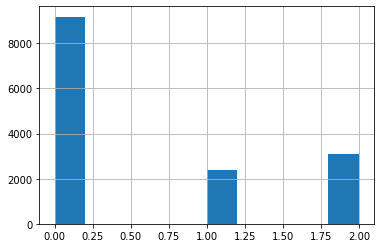

In [ ]:
df['airline_sentiment'].hist()

This histogram shows the imbalanced nature of the task - most tweets containing "hate" words as defined by Hatebase were 
only considered to be offensive by the CF coders. More tweets were considered to be neither hate speech nor offensive language than were considered hate speech.

In [ ]:
tweets=df.text
tweets

0                      @VirginAmerica What @dhepburn said.
1        @VirginAmerica plus you've added commercials t...
2        @VirginAmerica I didn't today... Must mean I n...
3        @VirginAmerica it's really aggressive to blast...
4        @VirginAmerica and it's a really big bad thing...
                               ...                        
14635    @AmericanAir thank you we got on a different f...
14636    @AmericanAir leaving over 20 minutes Late Flig...
14637    @AmericanAir Please bring American Airlines to...
14638    @AmericanAir you have my money, you change my ...
14639    @AmericanAir we have 8 ppl so we need 2 know h...
Name: text, Length: 14640, dtype: object

## Feature generation

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

#Preprocessing

In [ ]:
stopwords = nltk.corpus.stopwords.words("english")

other_exclusions = ["#ff", "ff", "rt"]
stopwords.extend(other_exclusions)

stemmer = PorterStemmer()


def preprocess(text_string):
    """
    Accepts a text string and replaces:
    1) urls with URLHERE
    2) lots of whitespace with one instance
    3) mentions with MENTIONHERE

    This allows us to get standardized counts of urls and mentions
    Without caring about specific people mentioned
    """
    space_pattern = '\s+'
    giant_url_regex = ('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|'
        '[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
    mention_regex = '@[\w\-]+'
    parsed_text = re.sub(space_pattern, ' ', text_string)
    parsed_text = re.sub(giant_url_regex, '', parsed_text)
    parsed_text = re.sub(mention_regex, '', parsed_text)
    return parsed_text

def tokenize(tweet):
    """Removes punctuation & excess whitespace, sets to lowercase,
    and stems tweets. Returns a list of stemmed tokens."""
    tweet = tweet.lower().strip().split()
    tokens = [stemmer.stem(t) for t in tweet]
    return tokens

def basic_tokenize(tweet):
    """Same as tokenize but without the stemming"""
    tweet = " ".join(re.split("[^a-zA-Z.,!?]*", tweet.lower())).strip()
    return tweet.split()


#TF-IDF Technique

In [ ]:

vectorizer = TfidfVectorizer(
    tokenizer=tokenize,
    preprocessor=preprocess,
    ngram_range=(1, 3),
    stop_words=stopwords,
    use_idf=True,
    smooth_idf=False,
    norm=None,
    decode_error='replace',
    max_features=10000,
    min_df=5,
    max_df=0.75
    )

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
#Construct tfidf matrix and get relevant scores
tfidf = vectorizer.fit_transform(tweets).toarray()

vocab = {v:i for i, v in enumerate(vectorizer.get_feature_names())}
idf_vals = vectorizer.idf_
idf_dict = {i:idf_vals[i] for i in vocab.values()} #keys are indices; values are IDF scores

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['b', 'c', 'e', 'f', 'g', 'h', 'j', 'l', 'n', 'p', 'r', 'u', 'v', 'w'] not in stop_words.
  % sorted(inconsistent)


In [ ]:
X = []
sentences = list(df['text'])
for sen in sentences:
    x=tokenize(preprocess(sen))
    X.append(x)

In [ ]:
X[0]

['what', 'said.']

# Running the model

We will use different models described as 

In [ ]:

y = df['airline_sentiment'].astype(int)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.1)

In [ ]:
#Construct tfidf matrix and get relevant scores
tfidf = vectorizer.fit_transform(X).toarray



/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['b', 'c', 'e', 'f', 'g', 'h', 'j', 'l', 'n', 'p', 'r', 'u', 'v', 'w'] not in stop_words.
  % sorted(inconsistent)


In [ ]:
tfidf

<bound method _cs_matrix.toarray of <14640x3052 sparse matrix of type '<class 'numpy.float64'>'
	with 946627 stored elements in Compressed Sparse Row format>>

In [ ]:
print('No. of feature_words: ', len(vectorizer.get_feature_names()))

No. of feature_words:  3052


In [ ]:
X_train = vectorizer.transform(X_train)
X_test  =vectorizer.transform(X_test)

In [ ]:
vocab = {v:i for i, v in enumerate(vectorizer.get_feature_names())}
idf_vals = vectorizer.idf_
idf_dict = {i:idf_vals[i] for i in vocab.values()} #keys are indices; values are IDF scores

## SVM

In [ ]:
# Classifier - Algorithm - SVM
# fit the training dataset on the classifier
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(X_train,y_train)
# predict the labels on validation dataset
predictions_SVM = SVM.predict(X_test)

In [ ]:
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  67.62295081967213


## SVM Confusion Matrix

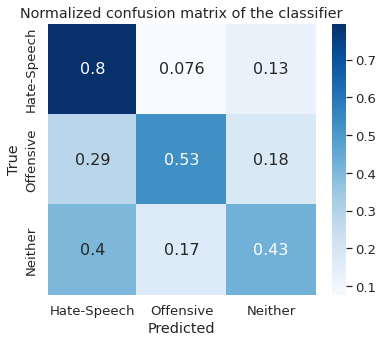

In [ ]:
import seaborn as sns
def plot_confusion_matrix(conf_mat):
    classes = ['Hate-Speech','Offensive','Neither']
    df_cm = pd.DataFrame(conf_mat,classes,classes)
    plt.figure(figsize=(6,5))
    sns.set(font_scale=1.2)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, cmap = 'Blues')
    plt.title('Normalized confusion matrix of the classifier')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    
    
cf_matrix = confusion_matrix(y_test, predictions_SVM, normalize = 'true')
cf_matrix
plot_confusion_matrix(cf_matrix)

### SVM Results

In [ ]:
report = classification_report( y_test, predictions_SVM )
print(report)

              precision    recall  f1-score   support

           0       0.79      0.80      0.80       924
           1       0.51      0.53      0.52       238
           2       0.44      0.43      0.43       302

    accuracy                           0.68      1464
   macro avg       0.58      0.58      0.58      1464
weighted avg       0.68      0.68      0.68      1464



## True vs Predicted Histogram (SVM)

<AxesSubplot:>

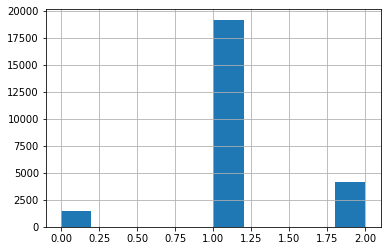

In [ ]:
#True distribution
y.hist()

<AxesSubplot:>

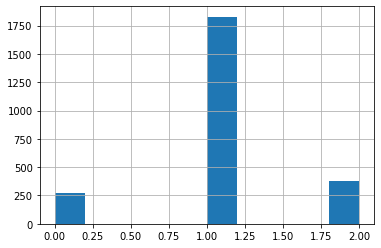

In [ ]:
pd.Series(predictions_SVM).hist()

# Word2Vec Technique

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.1)

In [ ]:
from gensim.models import Word2Vec, KeyedVectors
import nltk

embeddingsSize=512

model=Word2Vec(X_train, size=embeddingsSize, window=5, min_count=1, workers=4)

In [ ]:
import numpy as np
UNK_EMB = np.random.rand(embeddingsSize)
def getVectors(dataset):
  singleDataItemEmbedding=np.zeros(embeddingsSize)
  vectors=[]
  for dataItem in dataset:
    wordCount=0
    for word in dataItem:
      if word in model.wv.vocab:
        emb = model.wv[word]
      else:
        emb = UNK_EMB
      singleDataItemEmbedding=singleDataItemEmbedding + emb
      wordCount=wordCount+1

    singleDataItemEmbedding=singleDataItemEmbedding/wordCount  
    vectors.append(singleDataItemEmbedding)
  return vectors

In [ ]:
trainReviewVectors=getVectors(X_train)
testReviewVectors=getVectors(X_test)

In [ ]:
trainReviewVectors

[array([ 1.48794228e-01,  7.10957214e-02,  1.32043688e-01,  1.44098615e-02,
         3.69039954e-01,  7.09603699e-02,  2.65776711e-01,  2.09770088e-01,
        -4.19936896e-01,  2.79195380e-01, -1.36799275e-02,  1.97270030e-01,
         7.16780361e-02,  2.26701892e-01,  1.98239548e-01,  1.98380430e-02,
         3.01828595e-02,  4.50857250e-02, -2.40310140e-01,  1.52994116e-01,
         1.35685374e-01, -4.04756335e-01,  8.13435901e-02,  2.45669794e-01,
         1.13561969e-01,  6.17489673e-02, -1.34278353e-02, -3.48083380e-01,
         8.12592835e-02,  5.03896041e-03, -1.92051501e-01,  2.67194628e-01,
         3.87992466e-01,  9.19462612e-02,  3.39156019e-01,  1.05266963e-01,
         3.31065907e-01, -1.78654924e-02,  5.09745099e-02, -1.86052483e-01,
         1.08156659e-02,  1.06169453e-01,  6.07073961e-01,  3.56880949e-01,
         1.36088853e-01, -4.32422882e-02,  9.41230610e-02,  7.81683358e-02,
         6.39778026e-01,  1.16722382e-02,  1.90474053e-01, -4.13823501e-01,
         1.5

In [ ]:
from sklearn.metrics import accuracy_score
#add path of google drive to environment variable to load python files from google drive

from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import f1_score

def printResults(y_true, y_predicted):
  print("Accuracy= ", accuracy_score(y_true, y_predicted))

  import seaborn as sns
def plot_confusion_matrix(conf_mat):
    classes = ['Hate-Speech','Offensive','Neither']
    df_cm = pd.DataFrame(conf_mat,classes,classes)
    plt.figure(figsize=(6,5))
    sns.set(font_scale=1.2)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, cmap = 'Blues')
    plt.title('Normalized confusion matrix of the classifier')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

  

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import MultinomialNB
clfNB = MultinomialNB()

scaler = MinMaxScaler()
scaledTrainX= scaler.fit_transform(trainReviewVectors)
scaledTestX = scaler.transform(testReviewVectors)
clfNB.fit(scaledTrainX, y_train)
# clfNB.fit(trainReviewVectors, y_train)

#test naive bayes accuracy
testLabelsPredicted=list(clfNB.predict(scaledTestX))
# testLabelsPredicted=list(clfNB.predict(testReviewVectors))

print("####################RESULTS OF NAIVE BAYES CLASSIFIER##################")
printResults(testLabelsPredicted, y_test)

####################RESULTS OF NAIVE BAYES CLASSIFIER##################
Accuracy=  0.6379781420765027
